In [1]:
from math import pi
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import wavio
import IPython
import collections

In [2]:
def PreProcessData(xn, frameSize, stepSize):
    padding = len(xn) % stepSize
    if(padding == 0):
        temp = xn
    else:
        temp = np.append(xn, np.zeros(stepSize - padding))
    
    data = np.append(np.zeros(frameSize), temp)

    iteration = (len(data) // stepSize) - (frameSize // stepSize) + 1
    
    dataSet = np.zeros([iteration, frameSize])
    
    for i in range(iteration):
        start = i * stepSize
        end = start + frameSize
        dataSet[i] = data[start:end]
        
    return dataSet, data, len(data), iteration

In [3]:
frameSize = 4096
stepSize = 256

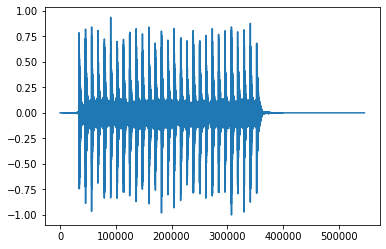

In [4]:
file = wavio.read("台北帝國intro.wav")
fixed_data = file.data[:, 0]
float_data = fixed_data.astype(np.float32, order='C') / 32767.0
dataSet, data, length, iteration = PreProcessData(float_data, frameSize, stepSize)

plt.plot(data)
plt.show()

IPython.display.display(IPython.display.Audio("台北帝國intro.wav", rate = file.rate))

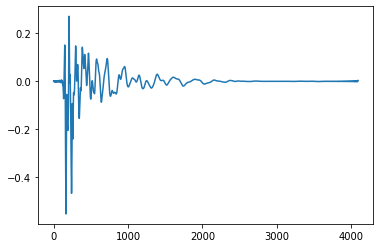

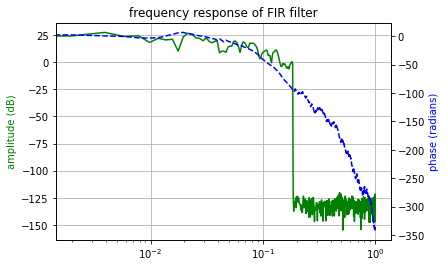

In [5]:
file = wavio.read("Direct Cabinet N1.wav")
fixed_data = file.data[:, 0]
float_data = fixed_data.astype(np.float32, order='C') / 32767.0

# there two method to deal with IR file into desire length
# 1. append zeros
# 2. resample it(Oversample and Downsample)
# taps = np.append(float_data, np.zeros(frameSize - len(float_data)))
taps = signal.resample(float_data, frameSize, window="hamming", domain='time')
Hn = np.fft.rfft(taps)

plt.plot(taps)
plt.show()

w, h = signal.freqz(taps)

amplitude = 20 * np.log10(abs(h))
angle = np.unwrap(np.angle(h))

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.title('frequency response of FIR filter')
plt.xlabel(r'normalized frequency (x$\pi$rad/sample)')

ax1.plot(w/max(w), amplitude, 'g')
ax1.set_ylabel('amplitude (dB)', color='g')
ax1.grid()

ax2.plot(w/max(w), angle, 'b--')
ax2.set_ylabel('phase (radians)', color='b')

plt.xscale("log")
plt.show()

IPython.display.display(IPython.display.Audio("Direct Cabinet N1.wav", rate = file.rate))

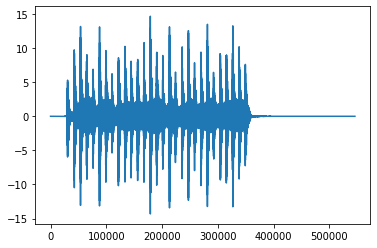

In [6]:
output = np.zeros(length)
    
for i in range(iteration):
    
    Xn = np.fft.rfft(dataSet[i])
    Yn = np.multiply(Xn, Hn)
    yn = np.fft.irfft(Yn)
    
    start = i * stepSize
    end = start + stepSize
    output[start:end] = yn[-stepSize:]

wavio.write("fft_fir_ols.wav", output, file.rate, sampwidth=3)

plt.plot(output)
plt.show()

IPython.display.display(IPython.display.Audio("fft_fir_ols.wav", rate=file.rate))

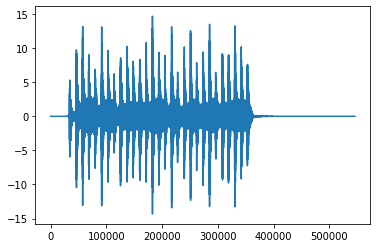

In [7]:
output = np.zeros(length)

for i in range(iteration):    
    
    xn = np.append(data[i * stepSize : (i+1) * stepSize], np.zeros(frameSize - stepSize))
    Xn = np.fft.rfft(xn)
    Yn = np.multiply(Xn, Hn)
    yn = np.fft.irfft(Yn)
    
    start = i * stepSize
    end = start + frameSize
    
    output[start:end] = output[start:end] + yn

wavio.write("fft_fir_ola.wav", output, file.rate, sampwidth=3)

plt.plot(output)
plt.show()

IPython.display.display(IPython.display.Audio("fft_fir_ola.wav", rate=file.rate))

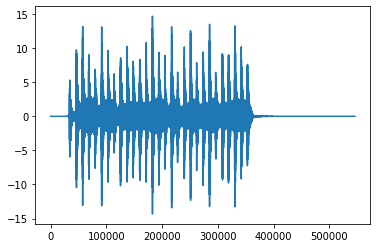

In [8]:
output = np.zeros(length)

bufferSize = int(frameSize//stepSize)
outputBuffer = collections.deque(maxlen=bufferSize)
for i in range(bufferSize):
    outputBuffer.append(np.zeros(frameSize))

for index in range(iteration):    
    
    xn = np.append(data[index * stepSize : (index+1) * stepSize], np.zeros(frameSize - stepSize))
    Xn = np.fft.rfft(xn)
    Yn = np.multiply(Xn, Hn)
    yn = np.fft.irfft(Yn)
    
    start = index * stepSize
    end = start + stepSize
    
    outputBuffer.appendleft(yn)
    
    for chunk in range(bufferSize):
        output[start:end] = output[start:end] + outputBuffer[chunk][chunk*stepSize : (chunk+1) * stepSize]

wavio.write("fft_fir_ola_v2.wav", output, file.rate, sampwidth=3)

plt.plot(output)
plt.show()

IPython.display.display(IPython.display.Audio("fft_fir_ola_v2.wav", rate=file.rate))

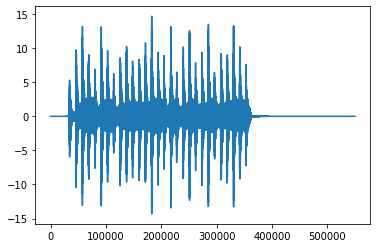

In [9]:
outputData = signal.convolve(taps, data)

wavio.write("fir_linear_conv.wav", outputData, file.rate, sampwidth=3)

plt.plot(outputData)
plt.show()

IPython.display.display(IPython.display.Audio("fir_linear_conv.wav", rate=file.rate))

In [ ]:
def fft_convolution(x, h, K=None):
    Nx = x.shape[0]
    Nh = h.shape[0]
    Ny = Nx + Nh - 1 # output length

    # Make K smallest optimal
    if K is None:
        K = next_power_of_2(Ny)

    # Calculate the fast Fourier transforms 
    # of the time-domain signals
    X = np.fft.fft(pad_zeros_to(x, K))
    H = np.fft.fft(pad_zeros_to(h, K))

    # Perform circular convolution in the frequency domain
    Y = np.multiply(X, H)

    # Go back to time domain
    y = np.real(np.fft.ifft(Y))

    # Trim the signal to the expected length
    return y[:Ny]

def overlap_save_convolution(x, h, B, K=None):
    """Overlap-Save convolution of x and h with block length B"""

    M = len(x)
    N = len(h)

    if K is None:
        K = max(B, next_power_of_2(N))
        
    # Calculate the number of input blocks
    num_input_blocks = np.ceil(M / B).astype(int) \
                     + np.ceil(K / B).astype(int) - 1

    # Pad x to an integer multiple of B
    xp = pad_zeros_to(x, num_input_blocks*B)

    output_size = num_input_blocks * B + N - 1
    y = np.zeros((output_size,))
    
    # Input buffer
    xw = np.zeros((K,))

    # Convolve all blocks
    for n in range(num_input_blocks):
        # Extract the n-th input block
        xb = xp[n*B:n*B+B]

        # Sliding window of the input
        xw = np.roll(xw, -B)
        xw[-B:] = xb

        # Fast convolution
        u = fft_convolution(xw, h, K)

        # Save the valid output samples
        y[n*B:n*B+B] = u[-B:]

    return y[:M+N-1]


overlap_save_convolution()